In [1]:
using Distributions
using StatsPlots
default(fmt=:png, tickfontsize=6, titlefontsize=12)

ECDF(A, x) = count(≤(x), A)/length(A)

function degree_of_freedom_Welchelch(m, sx², n, sy²)
    (sx²/m + sy²/n)^2 / ((sx²/m)^2/(m-1) + (sy²/n)^2/(n-1))
end

function plot_t_tests(;
        distx = Normal(),
        disty = Normal(),
        m = 10, 
        n = 10,
        s = 1,
        L = 10^6,
        ytick = 0:0.01:1,
        ylim = :auto,
        legend = :bottom,
        bin = :auto
    )
    println("(distribution of X) = distx = ", distx) 
    println("(distribution of Y) = disty = ", disty)
    println("(size of sample from X) = m = ", m)
    println("(size of sample from Y) = n = ", n)
    if s != 1 println("multiple of disty = ", s) end
    println()
    
    @show mean(distx)
    if s == 1 @show(mean(disty)) else @show(s*mean(disty)) end
    @show std(distx)
    if s == 1 @show(std(disty)) else @show(abs(s)*std(disty)) end
    println()
    
    X = rand(distx, m, L)
    Y = rand(disty, n, L)
    
    X̄ = mean(X; dims=1) |> vec
    Ȳ = s*mean(Y; dims=1) |> vec
    SX = std.(eachcol(X))
    SY = std.(eachcol(Y));
    S = @. √(((m-1)*SX^2 + (n-1)*SY^2)/(m+n-2))

    T_Student = @. (X̄ - Ȳ)/(S*√(1/m + 1/n))
    T_Welch = @. (X̄ - Ȳ)/√(SX^2/m + SY^2/n)
    @show T_Student ≈ T_Welch
    println()
    
    df_Student = m + n - 2
    DF_Welch = @. degree_of_freedom_Welchelch(m, SX^2, n, SY^2)
    @show df_Student
    @show mean(DF_Welch) std(DF_Welch)
    println()

    pval_Student = @. 2ccdf(TDist(m+n-2), abs(T_Student))
    pval_Welch = @. 2ccdf(TDist(DF_Welch), abs(T_Welch))

    @show ECDF(pval_Student, 0.05) ECDF(pval_Welch, 0.05)
    println()
    @show ECDF(pval_Student, 0.01) ECDF(pval_Welch, 0.01)
    println()
    
    P = plot(α -> ECDF(pval_Student, α), 0, 0.1; label="Student t-test")
    plot!(α -> ECDF(pval_Welch, α), 0, 0.1; label="Welch t-test", ls=:dash)
    plot!(identity, 0, 0.1; label="", ls=:dot, c=:black)
    plot!(; xtick=0:0.01:1, ytick, xrotation=90)
    plot!(; xguide="nominal significance level α",
        yguide="probability of p-value ≤ α")
    plot!(; legend=:outertop, legendfontsize=10)

    Q = stephist(pval_Student; norm=true, bin, label="Student t-test")
    stephist!(pval_Welch; norm=true, bin, ls=:dash, label="Welch t-test")
    plot!(; xguide="P-value", yguide="probability density")
    plot!(; xtick=0:0.05:1, ytick=0:0.1:5, xrotation=90)
    plot!(; legend=:outertop, legendfontsize=10, ylim)
    
    plot(P, Q; size=(1000, 460), layout=@layout [a{0.4w} b])
    plot!(; bottommargin=4Plots.mm, leftmargin=4Plots.mm)
end

function plot_df_and_tstatratio(;
        m = 9,
        n = 11,
        tick = Any[0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50, 100]
    )
    log10tick = (tick, string.(tick))
    as = 10.0 .^ range(log10(minimum(tick)), log10(maximum(tick)), 1000)

    P = plot(as, a -> degree_of_freedom_Welchelch(m, 1, n, a^2); label="Welch t-test")
    hline!([(m-1)+(n-1)]; label="Student t-test", ls=:dash)
    hline!([min(m-1, n-1)]; label="min(m-1, n-1)", ls=:dashdot)
    hline!([max(m-1, n-1)]; label="max(m-1, n-1)", ls=:dashdotdot)
    vline!([√((n*(n-1))/(m*(m-1)))]; label="√((n*(n-1))/(m*(m-1)))", ls=:dot)
    vline!([1]; label="", ls=:dot, c=:gray)
    plot!(xscale=:log10, xtick=log10tick)
    plot!(xguide="std(sample of Y) / std(sample of X)")
    title!("degree of freedom for m = $m, n = $n")

    Q = plot(as, a -> √(1/m + a^2/n) / √((((m-1)+(n-1)*a^2)/(m-1+n-1))*(1/m+1/n));
        label="t_Student / t_Welch")
    hline!([√(m/n), √(n/m)]; label="√(m/n), √(n/m)", ls=:dash)
    vline!([1]; label="", ls=:dot, c=:gray)
    plot!(xscale=:log10, xtick=log10tick)
    plot!(xguide="std(sample of Y) / std(sample of X)")
    plot!(ylim=(0.9, 1.1) .* minmax(√(m/n), √(n/m)))
    title!("t_Student / t_Welch for m = $m,  n = $n")

    plot(P, Q; size=(1000, 400))
    plot!(bottommargin=4Plots.mm)
end

plot_df_and_tstatratio (generic function with 1 method)

(distribution of X) = distx = Normal{Float64}(μ=0.0, σ=1.0)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 10
(size of sample from Y) = n = 10

mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 1.0
std(disty) = 1.0

T_Student ≈ T_Welch = true

df_Student = 18
mean(DF_Welch) = 16.538289856514076
std(DF_Welch) = 1.5672915303042974

ECDF(pval_Student, 0.05) = 0.049697
ECDF(pval_Welch, 0.05) = 0.048321

ECDF(pval_Student, 0.01) = 0.00996
ECDF(pval_Welch, 0.01) = 0.009288



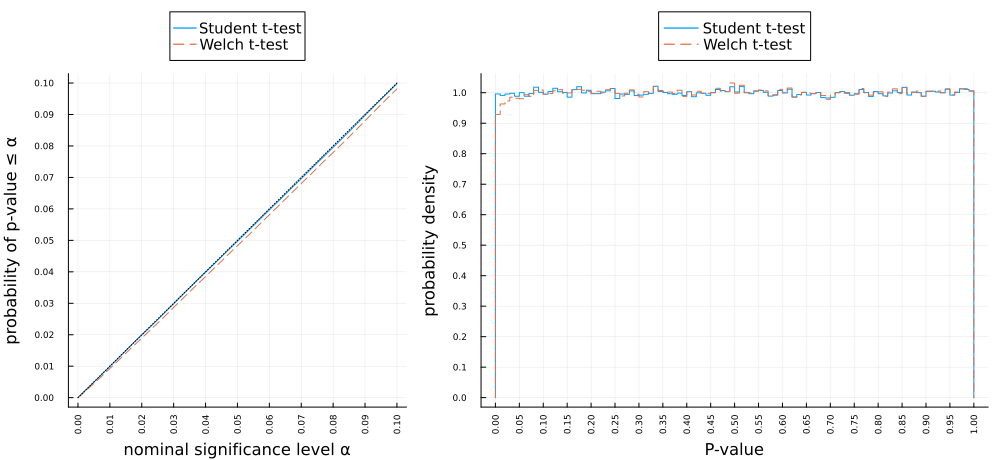

In [2]:
plot_t_tests(; distx = Normal(), disty = Normal(), m = 10, n = 10)

(distribution of X) = distx = Normal{Float64}(μ=0.0, σ=1.0)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 9
(size of sample from Y) = n = 11

mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 1.0
std(disty) = 1.0

T_Student ≈ T_Welch = false

df_Student = 18
mean(DF_Welch) = 16.08925799241764
std(DF_Welch) = 1.9220444545992266

ECDF(pval_Student, 0.05) = 0.050169
ECDF(pval_Welch, 0.05) = 0.048915

ECDF(pval_Student, 0.01) = 0.010029
ECDF(pval_Welch, 0.01) = 0.009442



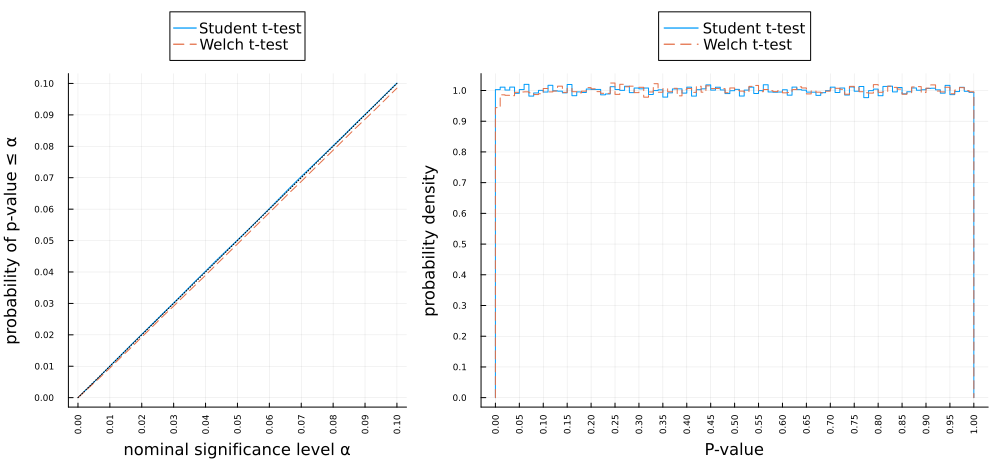

In [3]:
plot_t_tests(; distx = Normal(), disty = Normal(), m = 9, n = 11)

(distribution of X) = distx = Normal{Float64}(μ=0.0, σ=1.0)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 8
(size of sample from Y) = n = 12

mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 1.0
std(disty) = 1.0

T_Student ≈ T_Welch = false

df_Student = 18
mean(DF_Welch) = 14.81521223040453
std(DF_Welch) = 2.5795756445139593

ECDF(pval_Student, 0.05) = 0.050085
ECDF(pval_Welch, 0.05) = 0.049343

ECDF(pval_Student, 0.01) = 0.010051
ECDF(pval_Welch, 0.01) = 0.009836



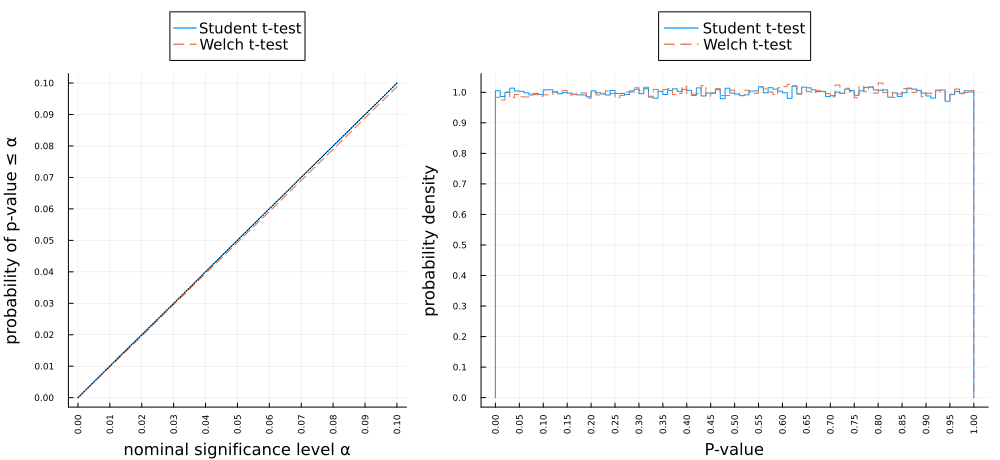

In [4]:
plot_t_tests(; distx = Normal(), disty = Normal(), m = 8, n = 12)

(distribution of X) = distx = Normal{Float64}(μ=1.3, σ=1.0)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 10
(size of sample from Y) = n = 10

mean(distx) = 1.3
mean(disty) = 0.0
std(distx) = 1.0
std(disty) = 1.0

T_Student ≈ T_Welch = true

df_Student = 18
mean(DF_Welch) = 16.536189329264054
std(DF_Welch) = 1.5712712843755066

ECDF(pval_Student, 0.05) = 0.784486
ECDF(pval_Welch, 0.05) = 0.780109

ECDF(pval_Student, 0.01) = 0.524959
ECDF(pval_Welch, 0.01) = 0.512731



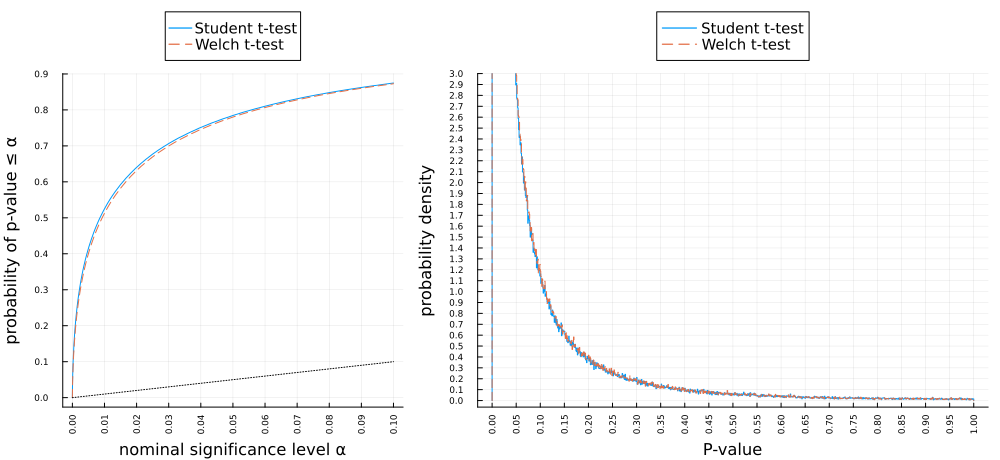

In [5]:
plot_t_tests(; distx = Normal(1.3, 1), disty = Normal(0, 1), m = 10, n = 10,
    ytick=0:0.1:1, ylim=(-0.06, 3))

(distribution of X) = distx = Normal{Float64}(μ=0.0, σ=2.0)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 10
(size of sample from Y) = n = 10

mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 2.0
std(disty) = 1.0

T_Student ≈ T_Welch = true

df_Student = 18
mean(DF_Welch) = 13.543260541824688
std(DF_Welch) = 2.2045166576351267

ECDF(pval_Student, 0.05) = 0.054463
ECDF(pval_Welch, 0.05) = 0.04991

ECDF(pval_Student, 0.01) = 0.012282
ECDF(pval_Welch, 0.01) = 0.010413



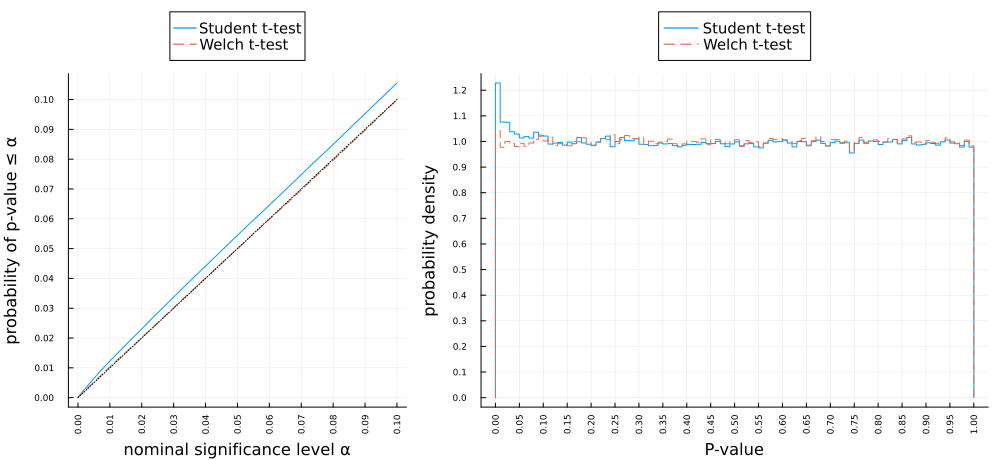

In [6]:
plot_t_tests(; distx = Normal(0, 2), disty = Normal(0, 1), m = 10, n = 10)

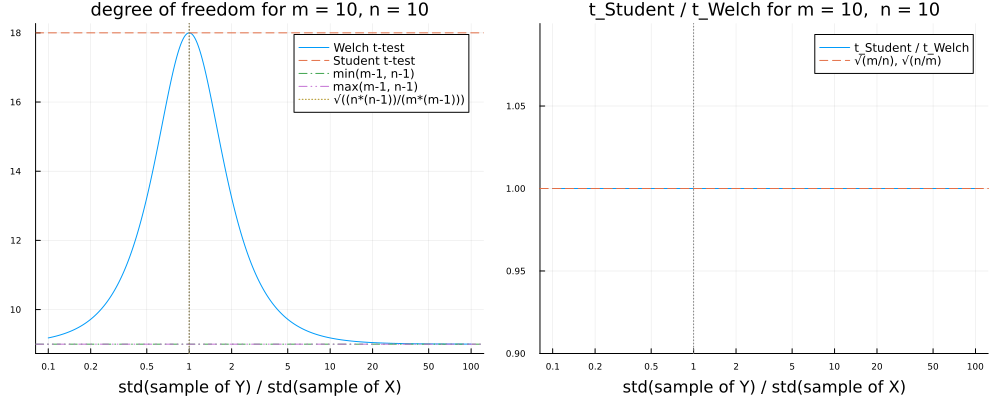

In [7]:
plot_df_and_tstatratio(; m = 10, n = 10)

(distribution of X) = distx = Normal{Float64}(μ=0.0, σ=2.0)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 9
(size of sample from Y) = n = 11

mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 2.0
std(disty) = 1.0

T_Student ≈ T_Welch = false

df_Student = 18
mean(DF_Welch) = 11.809611790559185
std(DF_Welch) = 2.228177916668507

ECDF(pval_Student, 0.05) = 0.069361
ECDF(pval_Welch, 0.05) = 0.050579

ECDF(pval_Student, 0.01) = 0.01755
ECDF(pval_Welch, 0.01) = 0.010715



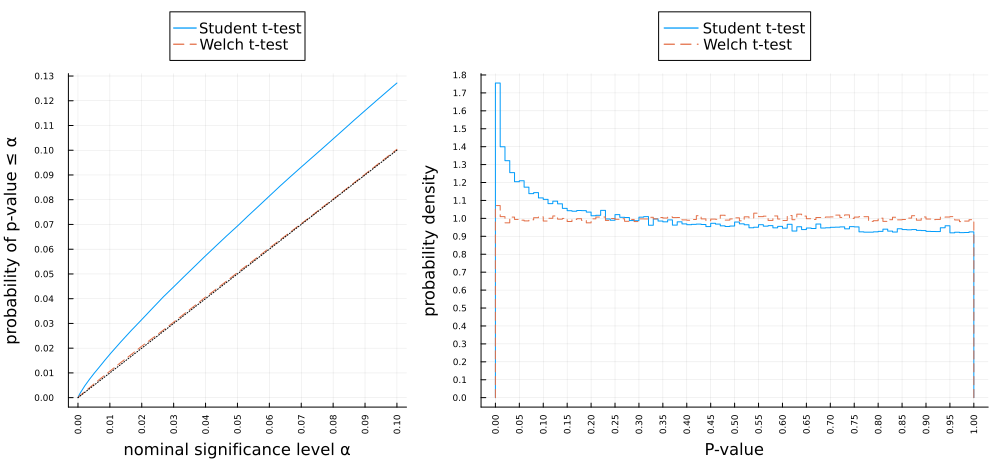

In [8]:
plot_t_tests(; distx = Normal(0, 2), disty = Normal(0, 1), m = 9, n = 11)

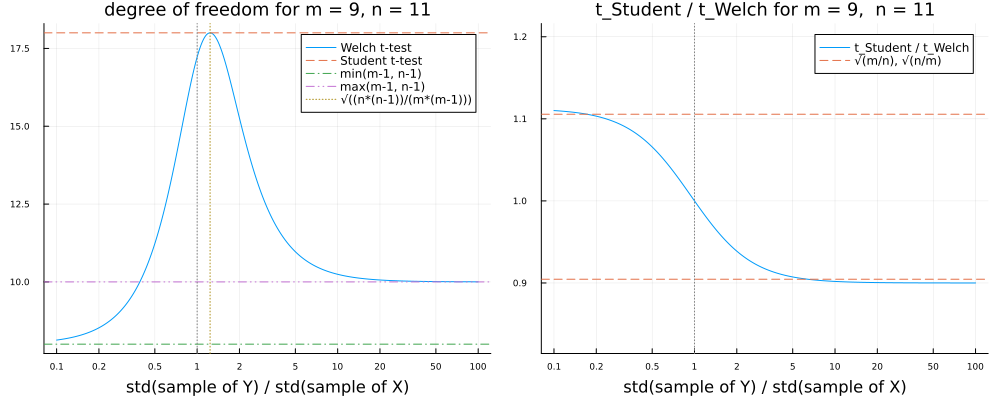

In [9]:
plot_df_and_tstatratio(; m = 9, n = 11)

(distribution of X) = distx = Normal{Float64}(μ=0.0, σ=2.0)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 8
(size of sample from Y) = n = 12

mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 2.0
std(disty) = 1.0

T_Student ≈ T_Welch = false

df_Student = 18
mean(DF_Welch) = 10.049441000500908
std(DF_Welch) = 2.1151560242666134

ECDF(pval_Student, 0.05) = 0.087708
ECDF(pval_Welch, 0.05) = 0.051557

ECDF(pval_Student, 0.01) = 0.024827
ECDF(pval_Welch, 0.01) = 0.01137



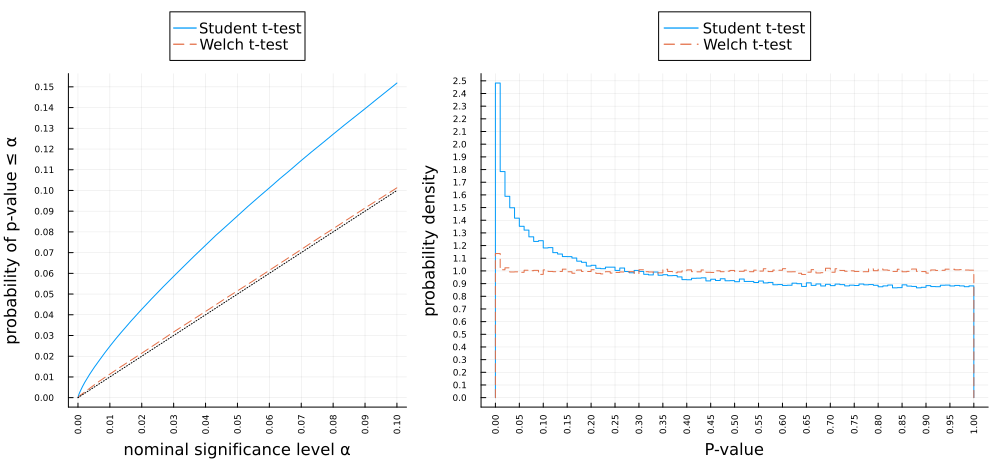

In [10]:
plot_t_tests(; distx = Normal(0, 2), disty = Normal(0, 1), m = 8, n = 12)

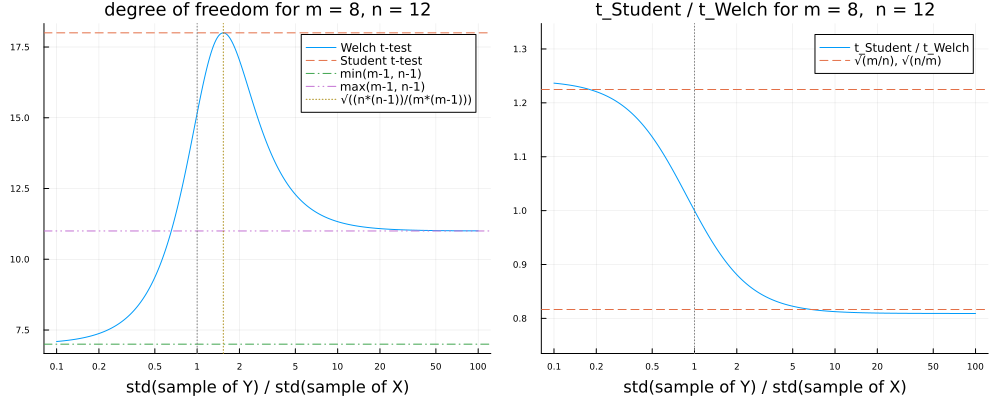

In [11]:
plot_df_and_tstatratio(; m = 8, n = 12)

(distribution of X) = distx = Normal{Float64}(μ=0.0, σ=2.0)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 80
(size of sample from Y) = n = 120

mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 2.0
std(disty) = 1.0

T_Student ≈ T_Welch = false

df_Student = 198
mean(DF_Welch) = 106.2307556553896
std(DF_Welch) = 5.619515705806291

ECDF(pval_Student, 0.05) = 0.083262
ECDF(pval_Welch, 0.05) = 0.05023

ECDF(pval_Student, 0.01) = 0.022708
ECDF(pval_Welch, 0.01) = 0.009991



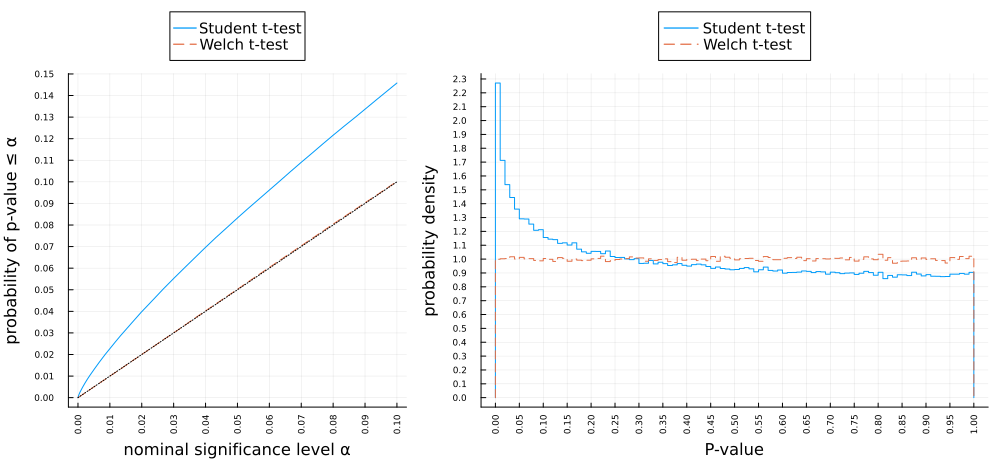

In [12]:
plot_t_tests(; distx = Normal(0, 2), disty = Normal(0, 1), m = 80, n = 120)

(distribution of X) = distx = Normal{Float64}(μ=0.0, σ=2.0)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 800
(size of sample from Y) = n = 1200

mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 2.0
std(disty) = 1.0

T_Student ≈ T_Welch = false

df_Student = 1998
mean(DF_Welch) = 1068.4371639145484
std(DF_Welch) = 17.1972851494262

ECDF(pval_Student, 0.05) = 0.08212
ECDF(pval_Welch, 0.05) = 0.04912

ECDF(pval_Student, 0.01) = 0.02203
ECDF(pval_Welch, 0.01) = 0.00952



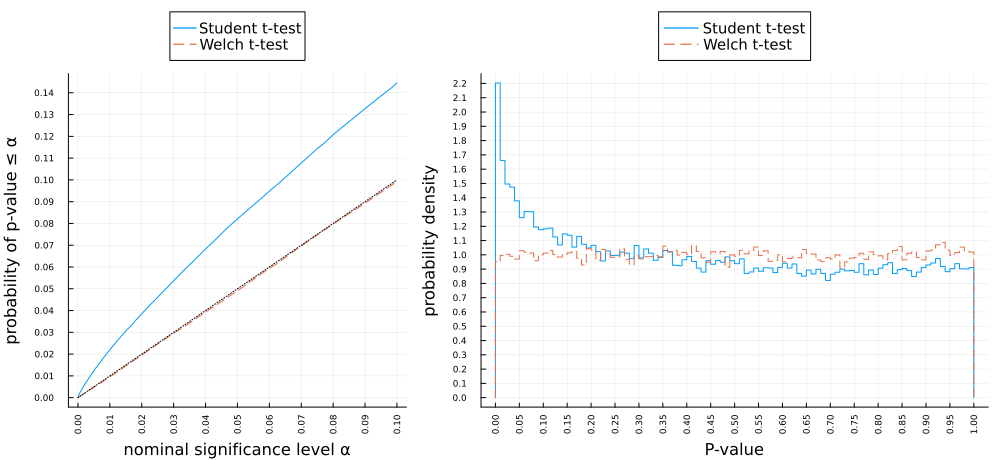

In [13]:
plot_t_tests(; distx = Normal(0, 2), disty = Normal(0, 1), m = 800, n = 1200, L = 10^5, bin=0:0.01:1)

(distribution of X) = distx = Normal{Float64}(μ=0.0, σ=3.0)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 9
(size of sample from Y) = n = 11

mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 3.0
std(disty) = 1.0

T_Student ≈ T_Welch = false

df_Student = 18
mean(DF_Welch) = 9.875983099499386
std(DF_Welch) = 1.4010766257806788

ECDF(pval_Student, 0.05) = 0.080541
ECDF(pval_Welch, 0.05) = 0.051025

ECDF(pval_Student, 0.01) = 0.023171
ECDF(pval_Welch, 0.01) = 0.011113



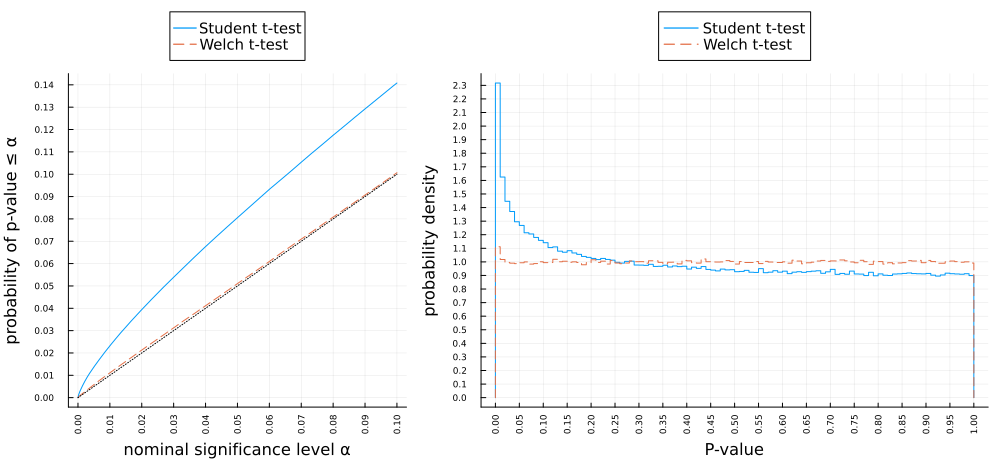

In [14]:
plot_t_tests(; distx = Normal(0, 3), disty = Normal(0, 1), m = 9, n = 11)

(distribution of X) = distx = Normal{Float64}(μ=0.0, σ=3.0)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 90
(size of sample from Y) = n = 110

mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 3.0
std(disty) = 1.0

T_Student ≈ T_Welch = false

df_Student = 198
mean(DF_Welch) = 105.56677074095246
std(DF_Welch) = 3.3833129127520096

ECDF(pval_Student, 0.05) = 0.072011
ECDF(pval_Welch, 0.05) = 0.050272

ECDF(pval_Student, 0.01) = 0.018319
ECDF(pval_Welch, 0.01) = 0.010146



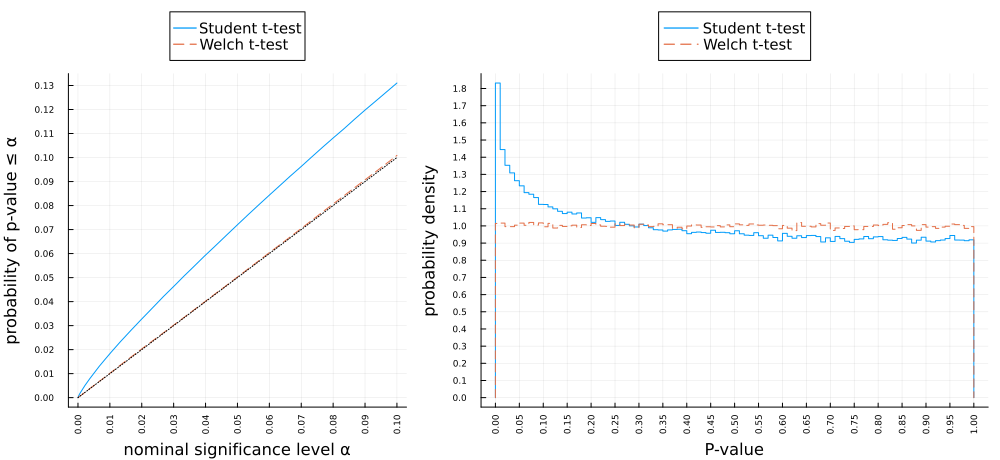

In [15]:
plot_t_tests(; distx = Normal(0, 3), disty = Normal(0, 1), m = 90, n = 110)

(distribution of X) = distx = Normal{Float64}(μ=0.0, σ=3.0)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 12
(size of sample from Y) = n = 8

mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 3.0
std(disty) = 1.0

T_Student ≈ T_Welch = false

df_Student = 18
mean(DF_Welch) = 14.471044035022382
std(DF_Welch) = 1.724775641599877

ECDF(pval_Student, 0.05) = 0.027715
ECDF(pval_Welch, 0.05) = 0.050158

ECDF(pval_Student, 0.01) = 0.004773
ECDF(pval_Welch, 0.01) = 0.010273



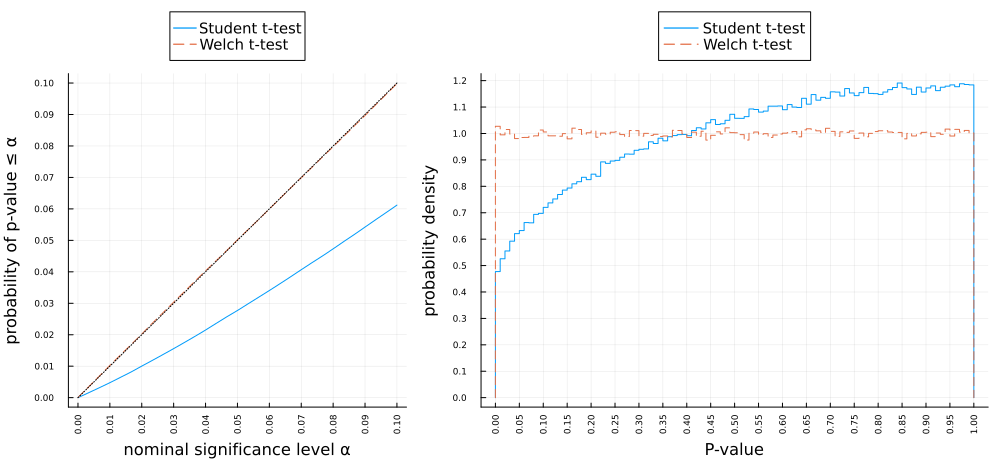

In [16]:
plot_t_tests(; distx = Normal(0, 3), disty = Normal(0, 1), m = 12, n = 8)

(distribution of X) = distx = Normal{Float64}(μ=2.83, σ=3.0)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 12
(size of sample from Y) = n = 8

mean(distx) = 2.83
mean(disty) = 0.0
std(distx) = 3.0
std(disty) = 1.0

T_Student ≈ T_Welch = false

df_Student = 18
mean(DF_Welch) = 14.47223195143836
std(DF_Welch) = 1.7265518286519201

ECDF(pval_Student, 0.05) = 0.701632
ECDF(pval_Welch, 0.05) = 0.802906

ECDF(pval_Student, 0.01) = 0.399102
ECDF(pval_Welch, 0.01) = 0.538016



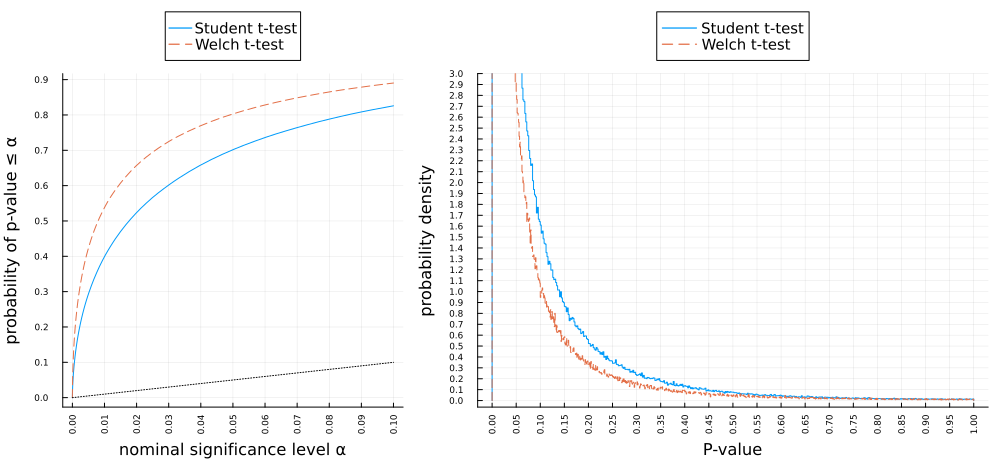

In [17]:
plot_t_tests(; distx = Normal(2.83, 3), disty = Normal(0, 1), m = 12, n = 8,
    ytick=0:0.1:1, ylim=(-0.06, 3))

(distribution of X) = distx = Normal{Float64}(μ=0.0, σ=1.1)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 10
(size of sample from Y) = n = 50

mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 1.1
std(disty) = 1.0

T_Student ≈ T_Welch = false

df_Student = 58
mean(DF_Welch) = 13.183651719729026
std(DF_Welch) = 2.992446787128279

ECDF(pval_Student, 0.05) = 0.065482
ECDF(pval_Welch, 0.05) = 0.051639

ECDF(pval_Student, 0.01) = 0.015434
ECDF(pval_Welch, 0.01) = 0.011395



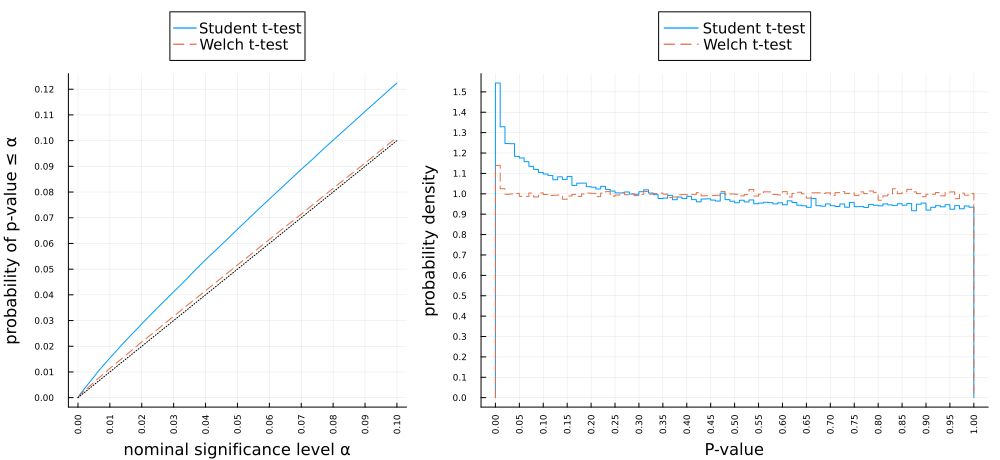

In [18]:
plot_t_tests(; distx = Normal(0, 1.1), disty = Normal(0, 1), m = 10, n = 50)

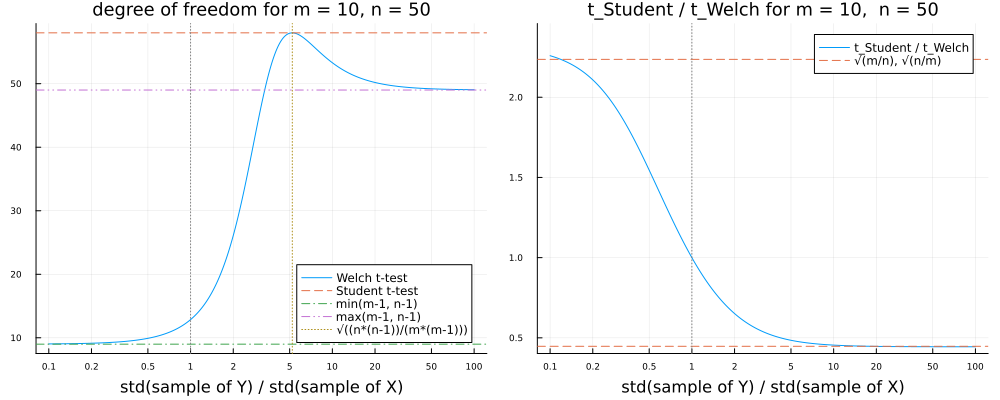

In [19]:
plot_df_and_tstatratio(; m = 10, n = 50)

(distribution of X) = distx = Normal{Float64}(μ=0.0, σ=1.1)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 20
(size of sample from Y) = n = 100

mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 1.1
std(disty) = 1.0

T_Student ≈ T_Welch = false

df_Student = 118
mean(DF_Welch) = 26.543015969799097
std(DF_Welch) = 3.1946170832513237

ECDF(pval_Student, 0.05) = 0.065894
ECDF(pval_Welch, 0.05) = 0.05063

ECDF(pval_Student, 0.01) = 0.015636
ECDF(pval_Welch, 0.01) = 0.010396



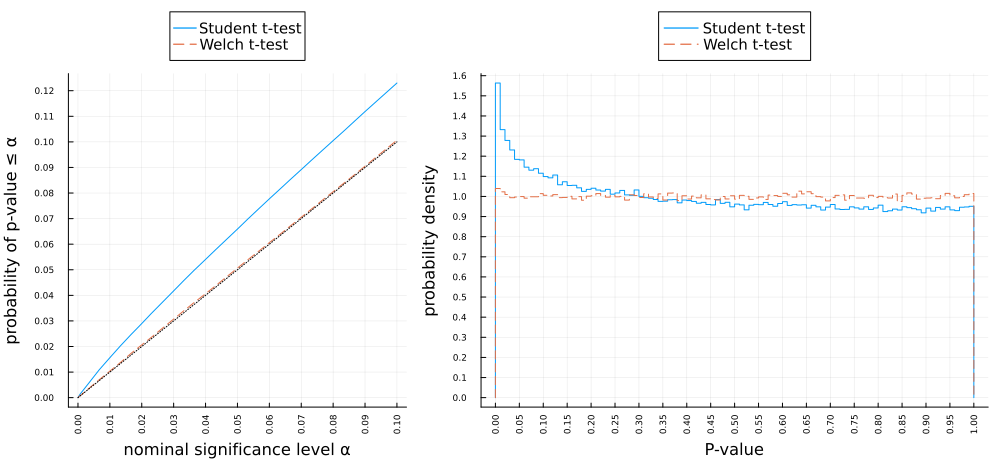

In [20]:
plot_t_tests(; distx = Normal(0, 1.1), disty = Normal(0, 1), m = 20, n = 100)

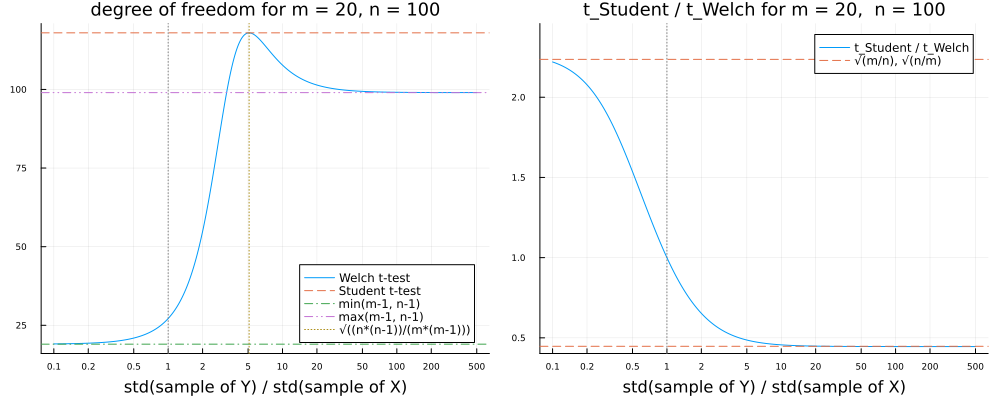

In [21]:
plot_df_and_tstatratio(; m = 20, n = 100,
    tick = Any[0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50, 100, 200, 500])

(distribution of X) = distx = Normal{Float64}(μ=0.0, σ=1.2)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 10
(size of sample from Y) = n = 30

mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 1.2
std(disty) = 1.0

T_Student ≈ T_Welch = false

df_Student = 38
mean(DF_Welch) = 14.675606627665363
std(DF_Welch) = 3.668663154930277

ECDF(pval_Student, 0.05) = 0.073405
ECDF(pval_Welch, 0.05) = 0.051534

ECDF(pval_Student, 0.01) = 0.018337
ECDF(pval_Welch, 0.01) = 0.011363



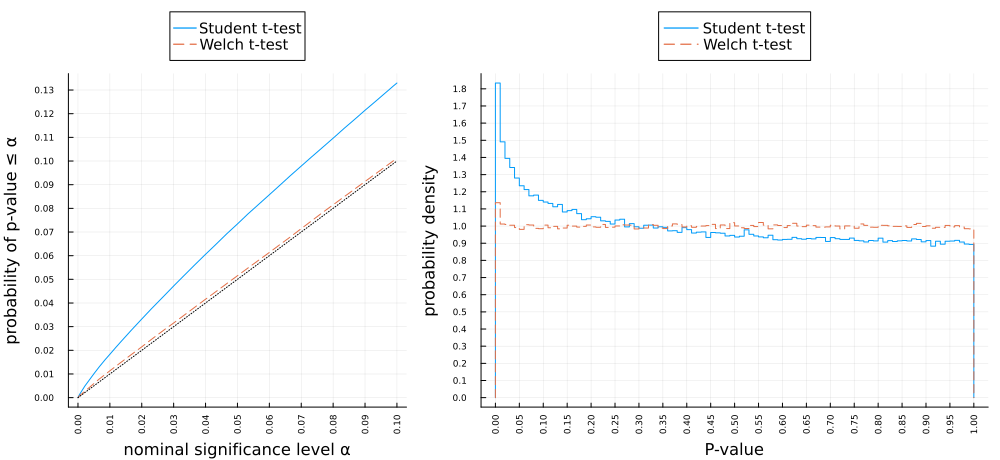

In [22]:
plot_t_tests(; distx = Normal(0, 1.2), disty = Normal(0, 1), m = 10, n = 30)

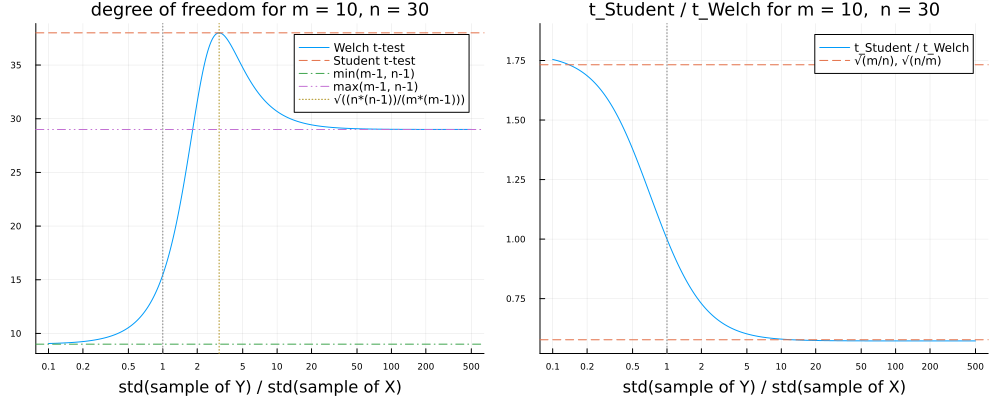

In [23]:
plot_df_and_tstatratio(; m = 10, n = 30,
    tick = Any[0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50, 100, 200, 500])

(distribution of X) = distx = Normal{Float64}(μ=0.0, σ=1.2)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 20
(size of sample from Y) = n = 60

mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 1.2
std(disty) = 1.0

T_Student ≈ T_Welch = false

df_Student = 78
mean(DF_Welch) = 29.47122039547023
std(DF_Welch) = 4.429998455277597

ECDF(pval_Student, 0.05) = 0.073395
ECDF(pval_Welch, 0.05) = 0.050394

ECDF(pval_Student, 0.01) = 0.018497
ECDF(pval_Welch, 0.01) = 0.010373



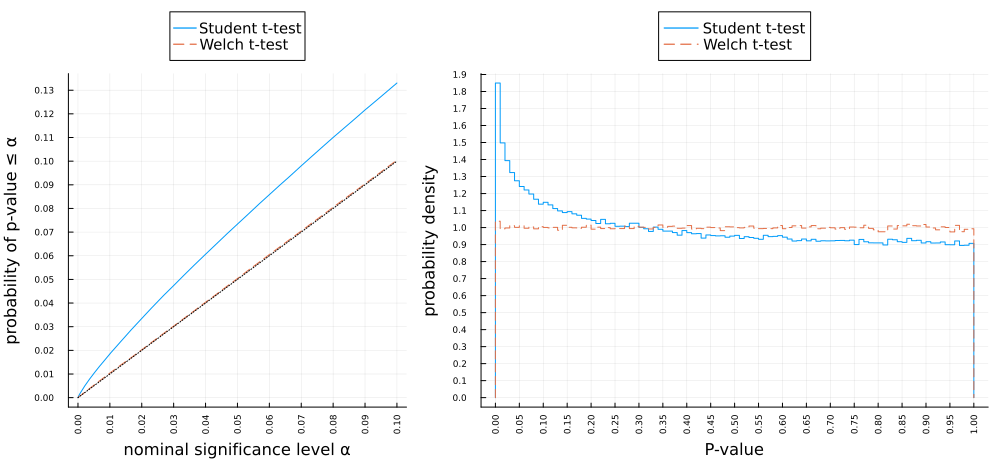

In [24]:
plot_t_tests(; distx = Normal(0, 1.2), disty = Normal(0, 1), m = 20, n = 60)

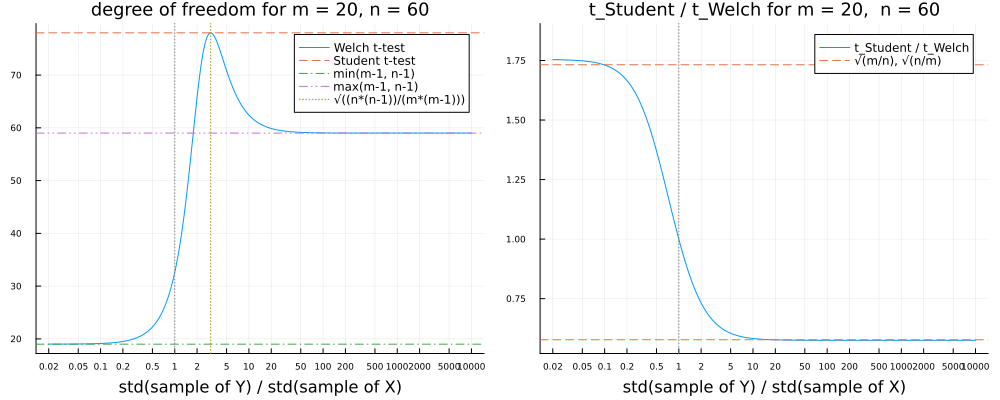

In [25]:
plot_df_and_tstatratio(; m = 20, n = 60,
    tick = Any[0.02, 0.05, 0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50, 100, 200, 500, 1000, 2000, 5000, 10000])

(distribution of X) = distx = Normal{Float64}(μ=0.0, σ=1.2)
(distribution of Y) = disty = Normal{Float64}(μ=0.0, σ=1.0)
(size of sample from X) = m = 20
(size of sample from Y) = n = 60

mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 1.2
std(disty) = 1.0

T_Student ≈ T_Welch = false

df_Student = 78
mean(DF_Welch) = 29.4759130534353
std(DF_Welch) = 4.434478418499361

ECDF(pval_Student, 0.05) = 0.07344
ECDF(pval_Welch, 0.05) = 0.050459

ECDF(pval_Student, 0.01) = 0.018378
ECDF(pval_Welch, 0.01) = 0.010329



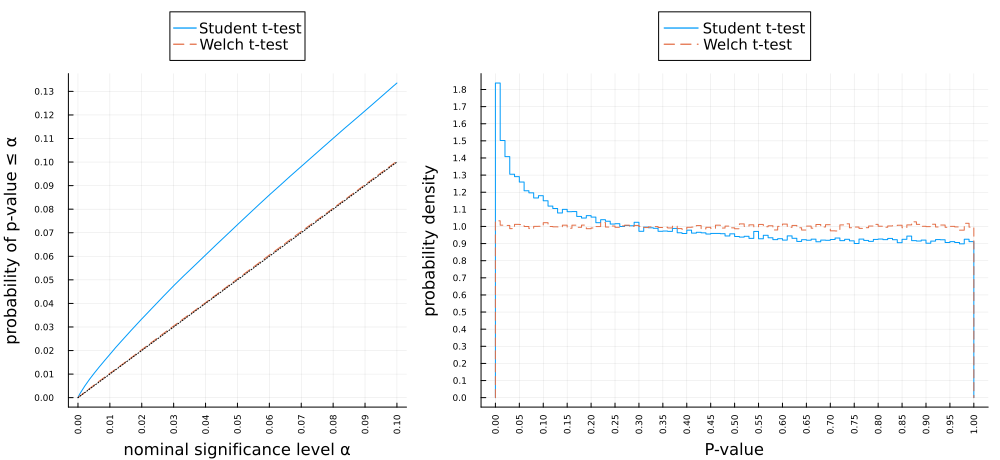

In [26]:
plot_t_tests(; distx = Normal(0, 1.2), disty = Normal(0, 1), m = 20, n = 60)

(distribution of X) = distx = Gamma{Float64}(α=1.0, θ=4.0)
(distribution of Y) = disty = Gamma{Float64}(α=4.0, θ=1.0)
(size of sample from X) = m = 100
(size of sample from Y) = n = 100

mean(distx) = 4.0
mean(disty) = 4.0
std(distx) = 4.0
std(disty) = 2.0

T_Student ≈ T_Welch = true

df_Student = 198
mean(DF_Welch) = 147.68772447482283
std(DF_Welch) = 13.532929358757764

ECDF(pval_Student, 0.05) = 0.05382
ECDF(pval_Welch, 0.05) = 0.053395

ECDF(pval_Student, 0.01) = 0.012977
ECDF(pval_Welch, 0.01) = 0.012791



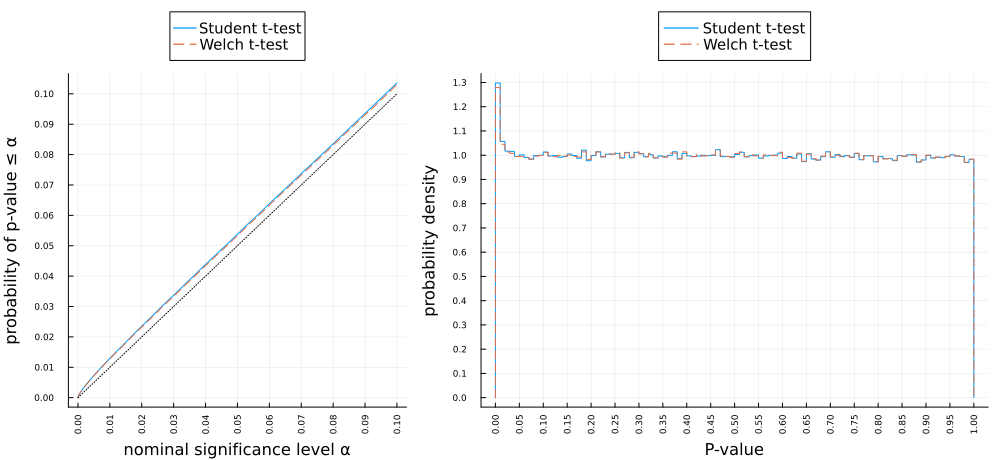

In [27]:
plot_t_tests(; distx = Gamma(1, 4), disty = Gamma(4, 1), m = 100, n = 100)

(distribution of X) = distx = Gamma{Float64}(α=1.0, θ=4.0)
(distribution of Y) = disty = Gamma{Float64}(α=4.0, θ=1.0)
(size of sample from X) = m = 90
(size of sample from Y) = n = 110

mean(distx) = 4.0
mean(disty) = 4.0
std(distx) = 4.0
std(disty) = 2.0

T_Student ≈ T_Welch = false

df_Student = 198
mean(DF_Welch) = 127.36705757819236
std(DF_Welch) = 12.157528164596672

ECDF(pval_Student, 0.05) = 0.068299
ECDF(pval_Welch, 0.05) = 0.054118

ECDF(pval_Student, 0.01) = 0.018291
ECDF(pval_Welch, 0.01) = 0.013486



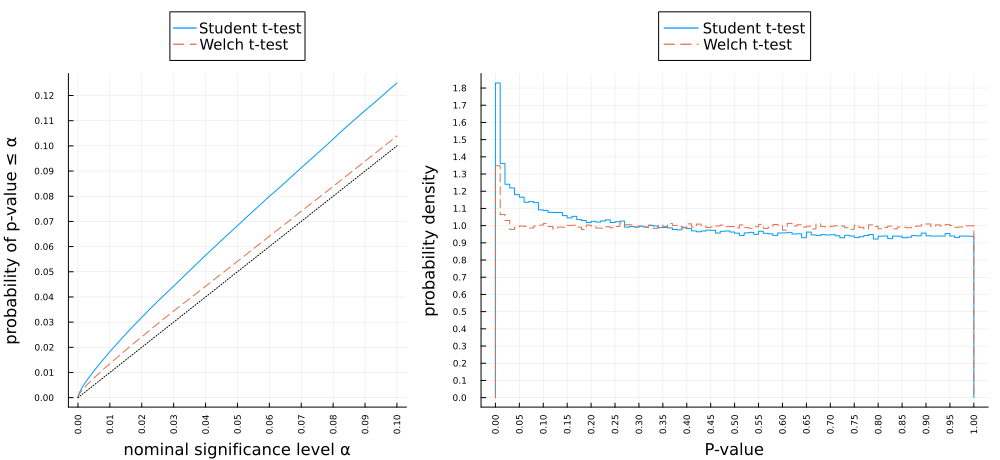

In [28]:
plot_t_tests(; distx = Gamma(1, 4), disty = Gamma(4, 1), m = 90, n = 110)

(distribution of X) = distx = Gamma{Float64}(α=1.0, θ=4.0)
(distribution of Y) = disty = Gamma{Float64}(α=4.0, θ=1.0)
(size of sample from X) = m = 80
(size of sample from Y) = n = 120

mean(distx) = 4.0
mean(disty) = 4.0
std(distx) = 4.0
std(disty) = 2.0

T_Student ≈ T_Welch = false

df_Student = 198
mean(DF_Welch) = 108.03083306916255
std(DF_Welch) = 10.122559995259365

ECDF(pval_Student, 0.05) = 0.086092
ECDF(pval_Welch, 0.05) = 0.055977

ECDF(pval_Student, 0.01) = 0.025324
ECDF(pval_Welch, 0.01) = 0.014725



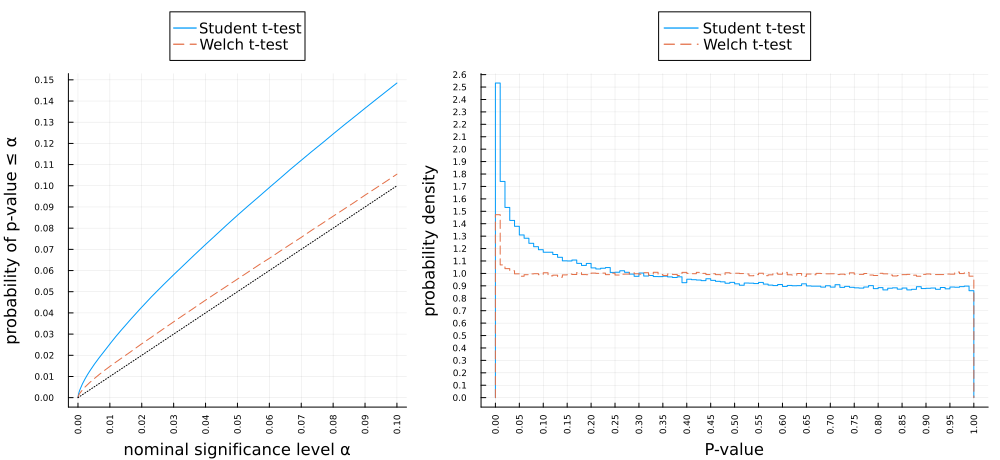

In [29]:
plot_t_tests(; distx = Gamma(1, 4), disty = Gamma(4, 1), m = 80, n = 120)

(distribution of X) = distx = LogNormal{Float64}(μ=0.1, σ=0.7)
(distribution of Y) = disty = LogNormal{Float64}(μ=0.2, σ=0.7)
(size of sample from X) = m = 1000
(size of sample from Y) = n = 1000

mean(distx) = 1.411989919667659
mean(disty) = 1.5604901958326667
std(distx) = 1.1227905724784957
std(disty) = 1.2408754877927413

T_Student ≈ T_Welch = true

df_Student = 1998
mean(DF_Welch) = 1962.7054000788953
std(DF_Welch) = 40.761324552514985

ECDF(pval_Student, 0.05) = 0.80317
ECDF(pval_Welch, 0.05) = 0.80317

ECDF(pval_Student, 0.01) = 0.5926
ECDF(pval_Welch, 0.01) = 0.59259



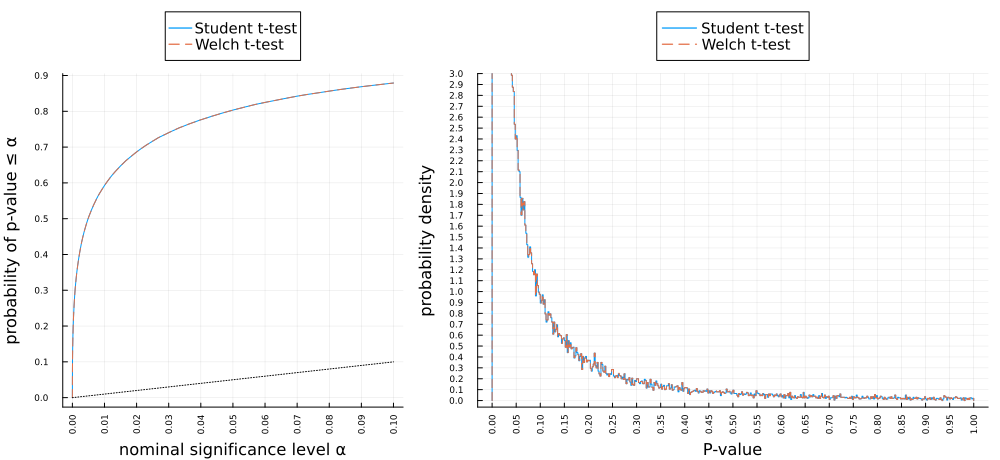

In [30]:
distx = LogNormal(0.1, 0.7)
disty = LogNormal(0.2, 0.7)
plot_t_tests(; distx, disty, m = 10^3, n = 10^3, L = 10^5, ytick=0:0.1:1, ylim=(-0.06, 3))

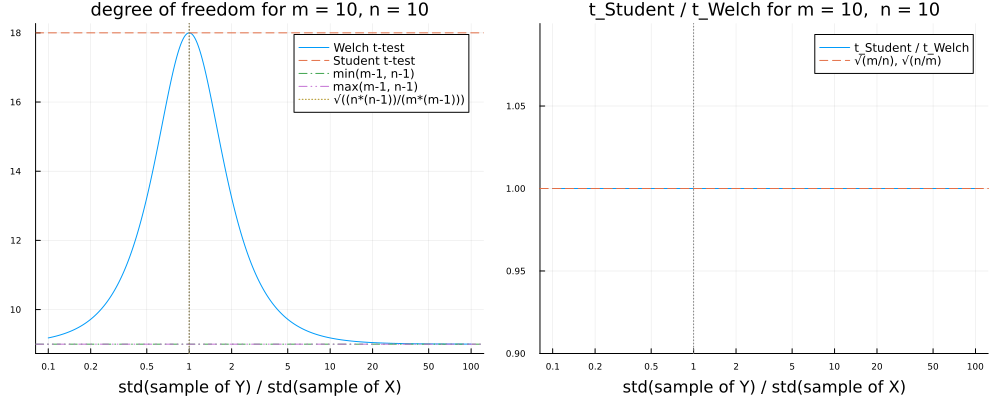

In [31]:
plot_df_and_tstatratio(; m=10, n=10)

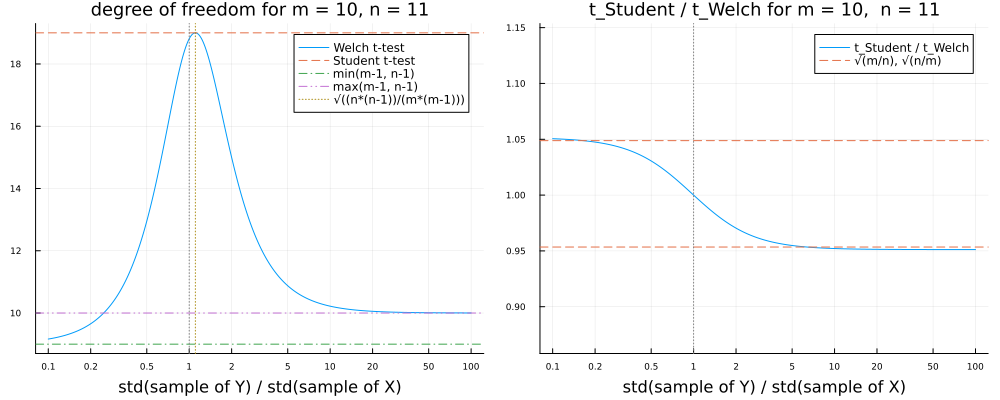

In [32]:
plot_df_and_tstatratio(; m=10, n=11)

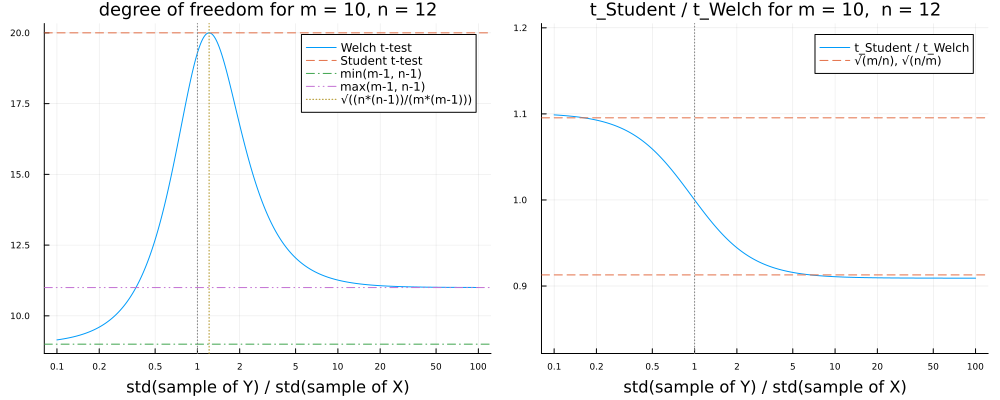

In [33]:
plot_df_and_tstatratio(; m=10, n=12)

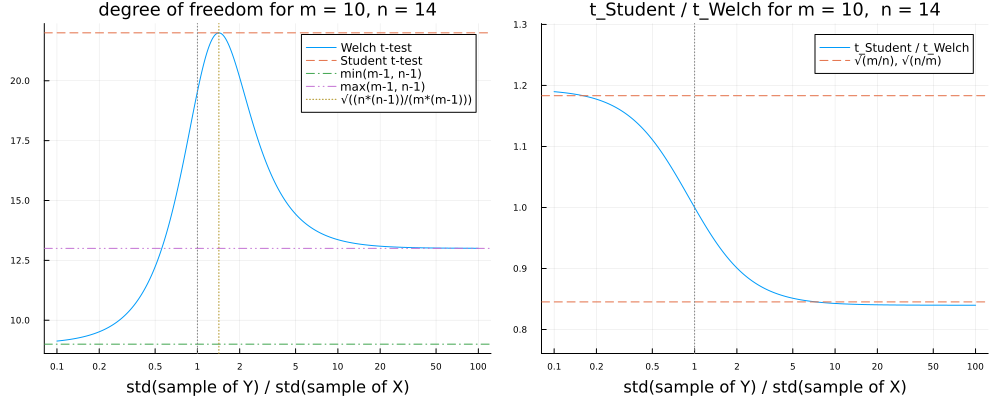

In [34]:
plot_df_and_tstatratio(; m=10, n=14)

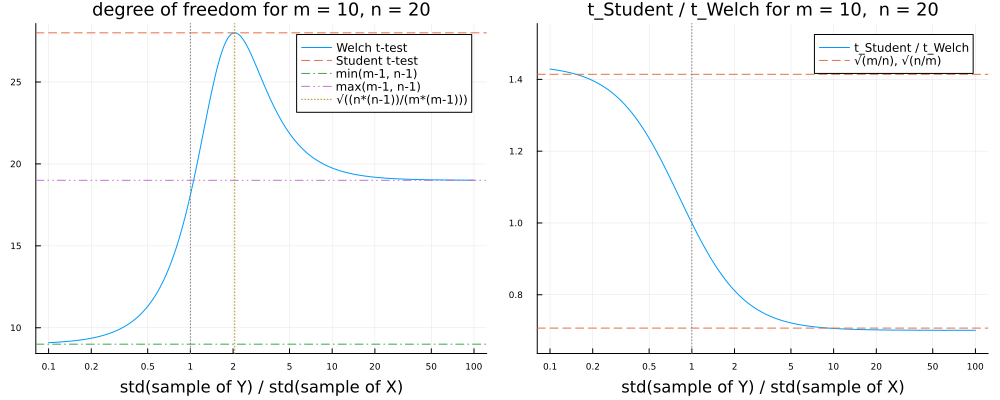

In [35]:
plot_df_and_tstatratio(; m=10, n=20)

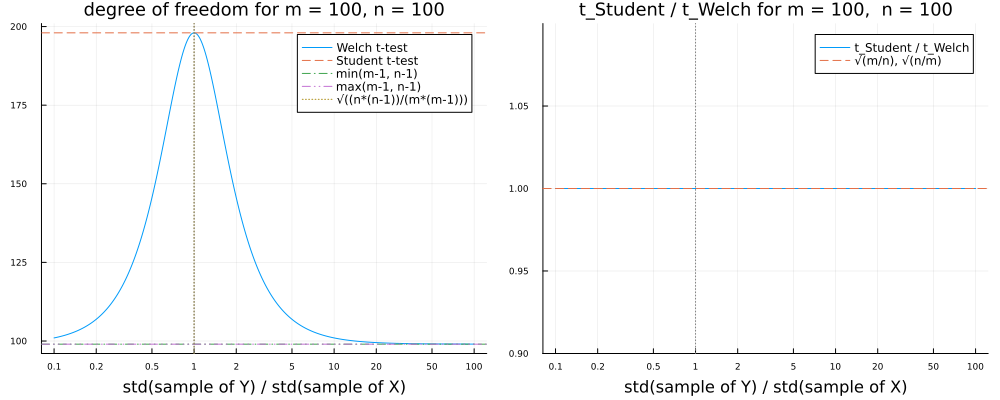

In [36]:
plot_df_and_tstatratio(; m=100, n=100)

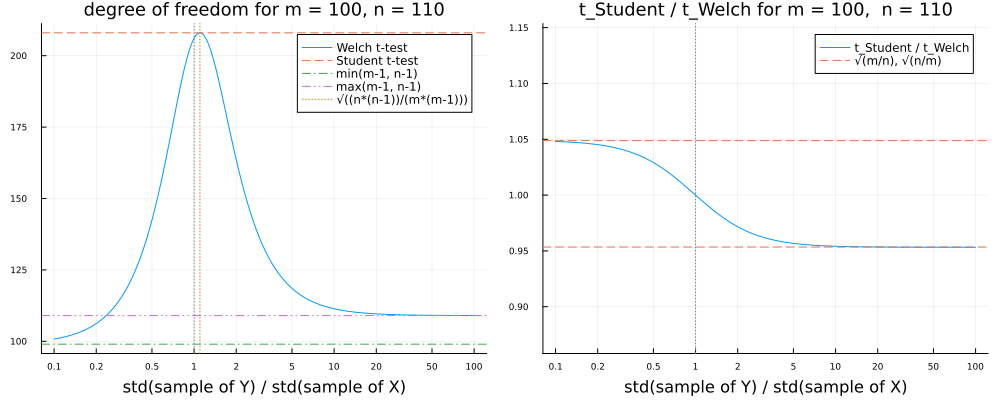

In [37]:
plot_df_and_tstatratio(; m=100, n=110)

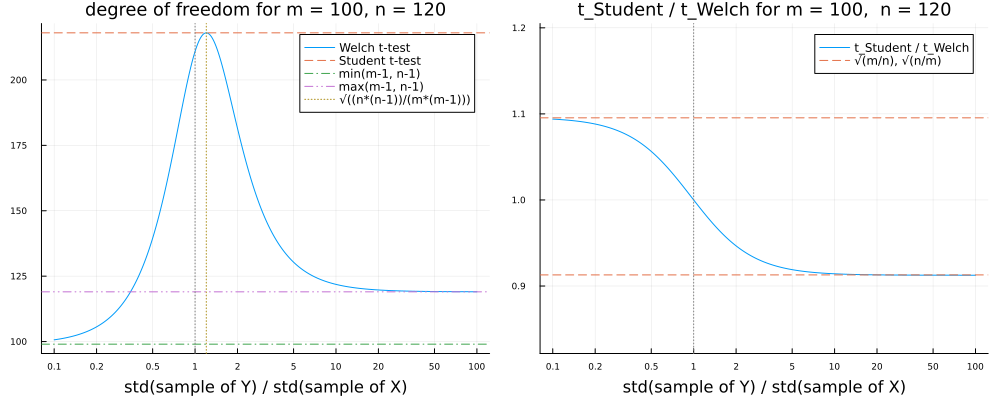

In [38]:
plot_df_and_tstatratio(; m=100, n=120)

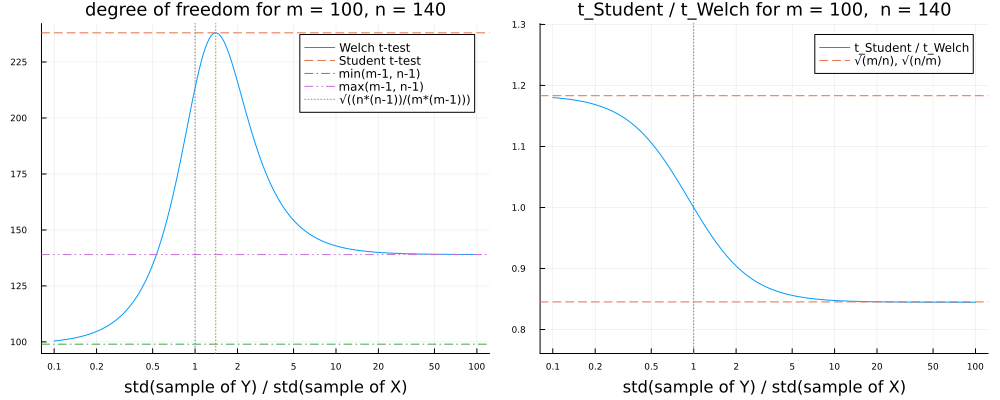

In [39]:
plot_df_and_tstatratio(; m=100, n=140)

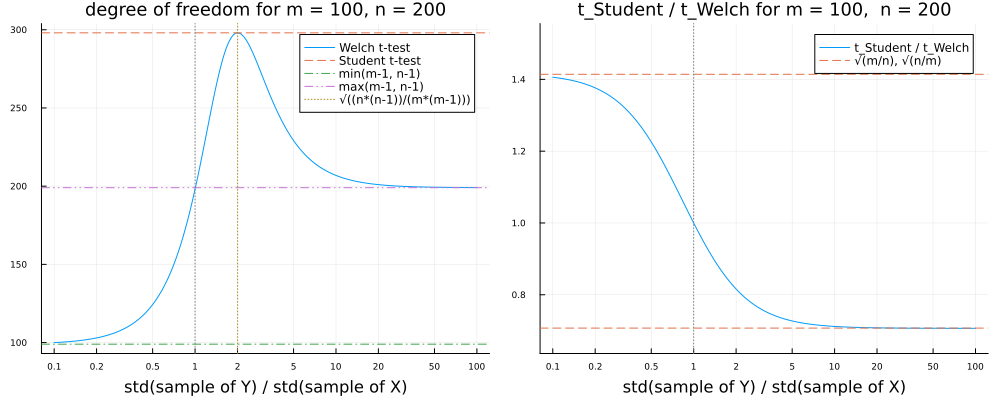

In [40]:
plot_df_and_tstatratio(; m=100, n=200)

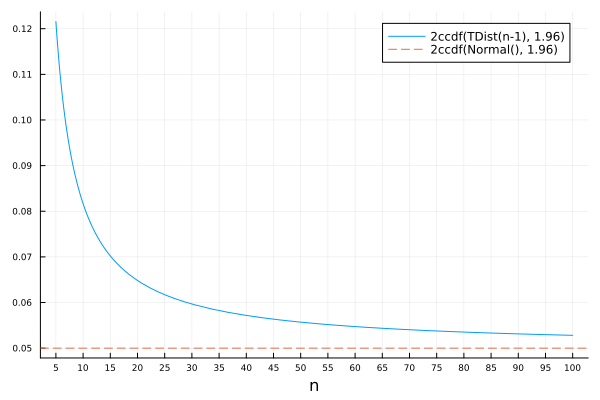

In [41]:
z = 1.96
plot(n -> 2ccdf(TDist(n-1), z), 5, 100; label="2ccdf(TDist(n-1), $z)")
hline!([2ccdf(Normal(), z)]; label="2ccdf(Normal(), $z)", ls=:dash)
plot!(xguide="n")
plot!(xtick=0:5:100, ytick=0:0.01:1)

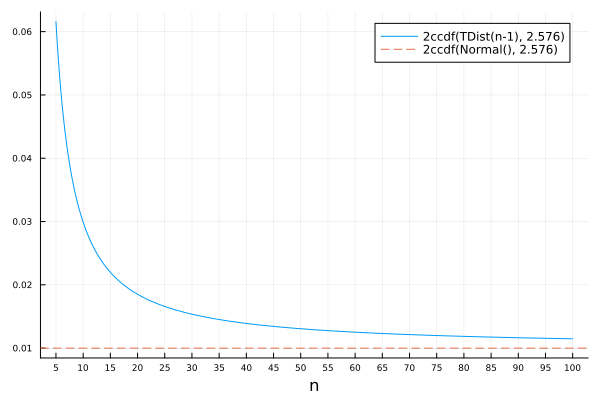

In [42]:
z = 2.576
plot(n -> 2ccdf(TDist(n-1), z), 5, 100; label="2ccdf(TDist(n-1), $z)")
hline!([2ccdf(Normal(), z)]; label="2ccdf(Normal(), $z)", ls=:dash)
plot!(xguide="n")
plot!(xtick=0:5:100, ytick=0:0.01:1)

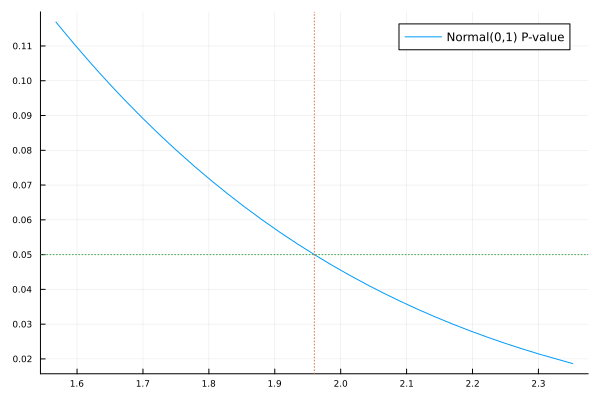

In [43]:
z = 1.96
plot(x -> 2ccdf(Normal(0,1), x), 0.8z, 1.2z; label="Normal(0,1) P-value")
plot!(xtick=0:0.1:4, ytick=0:0.01:1)
vline!([z]; label="", ls=:dot)
hline!([2ccdf(Normal(), z)]; label="", ls=:dot)

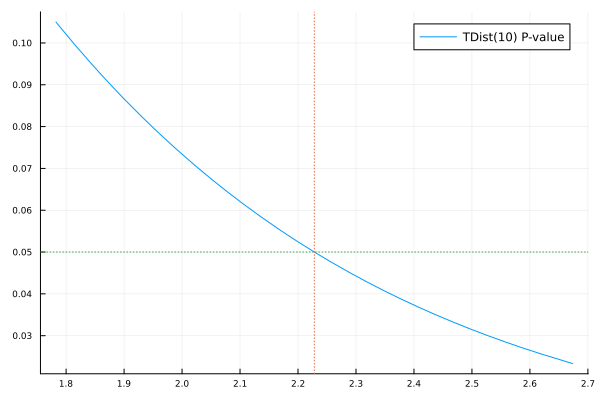

In [44]:
dist = TDist(10)
z = cquantile(dist, 0.05/2)
plot(x -> 2ccdf(dist, x), 0.8z, 1.2z; label="TDist(10) P-value")
plot!(xtick=0:0.1:4, ytick=0:0.01:1)
vline!([z]; label="", ls=:dot)
hline!([2ccdf(dist, z)]; label="", ls=:dot)